In [ ]:
!nvidia-smi

Mon Aug 23 18:42:55 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install tensorflow_graphics

     |████████████████████████████████| 544 kB 4.1 MB/s 
     |████████████████████████████████| 296 kB 71.1 MB/s 
     |████████████████████████████████| 635 kB 66.9 MB/s 
     |████████████████████████████████| 1.1 MB 61.1 MB/s 
  Created wheel for OpenEXR: filename=OpenEXR-1.3.2-cp37-cp37m-linux_x86_64.whl size=189402 sha256=68014c6f270fae76700c2b7a7080a5c76b192106d1be09f2836e462ffa145acc
  Stored in directory: /root/.cache/pip/wheels/d1/c6/6c/dcf5d042ed2d547da41021f47957b16bebe9cadfd095765d44
Successfully built OpenEXR
  Attempting uninstall: psutil
    Found existing installation: psutil 5.4.8
    Uninstalling psutil-5.4.8:
      Successfully uninstalled psutil-5.4.8


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ln -s /content/drive/MyDrive/core_plugs/ core_plugs
!cp -r ./core_plugs/raws/ ./raws
!python ./core_plugs/make_slices.py -i ./raws -o ./slices

Slice #1/11
2021-08-23 18:48:01.269073: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-23 18:48:01.668993: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-23 18:48:01.669749: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-23 18:48:01.683653: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-23 18:48:01.684252: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node

In [ ]:
#@title Parameters
#@markdown Forms support many types of fields.

slices_folder = './slices' #@param {type: "string"}
im_height = 250 #@param {type: "number"}
im_width =  250#@param {type: "number"}
seq_len = 2 #@param {type: "number"}
window_shift =  1#@param {type: "number"}
window_stride =  19#@param {type: "number"}
batch_size = 4 #@param {type: "number"}
num_epochs = 100 #@param {type: "number"}
prefetch_num = -1 #@param
val_core_list = ['BB_2d25um_binary'] #@param
latent_dim = 8 #@param {type: "number"}
dense_dim = 16 #@param {type: "number"}
betta = 1 #@param {type: "number"}
#@markdown ---


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from core_plugs.dataset_of import read_dataset
from matplotlib import pyplot as plt
import numpy as np
import time
from tqdm import tqdm
from tensorflow_graphics.image.transformer import sample

plt.gray()

<Figure size 432x288 with 0 Axes>

In [ ]:
train_dataset, test_dataset, val_datasets = read_dataset(
    slices_folder,
    slices_type = tf.uint8,
    im_height=im_height,
    im_width=im_width,
    seq_len=seq_len,
    batch_size=batch_size,
    prefetch_num=prefetch_num,
    val_core_list = val_core_list,
    window_shift=window_shift,
    window_stride=window_stride)

In [ ]:
from_n = 500
to_n = 520

(4, 2, 250, 250, 1)


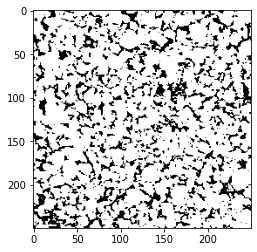

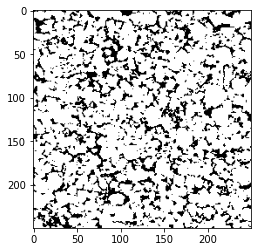

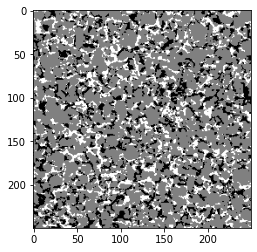

In [ ]:
for sl in train_dataset.take(1):
  print(sl.shape)
  plt.imshow(sl[0,0,:,:,0])
  plt.show()
  plt.imshow(sl[0,1,:,:,0])
  plt.show()
  plt.imshow(sl[0,0,:,:,0] - sl[0,1,:,:,0])
  plt.show()

In [ ]:
input_shape = None
for x in train_dataset.take(1):
    input_shape = x[0].shape
    
print(input_shape)

(2, 250, 250, 1)


In [ ]:
x,y = tf.meshgrid(tf.range(0, im_height, dtype=tf.float32), tf.range(0, im_width, dtype=tf.float32))
im_grid = tf.stack([x,y],-1)
print(im_grid.shape)

(250, 250, 2)


In [ ]:
encoder_inputs_1 = keras.Input(shape=input_shape[1:])
encoder_inputs_2 = keras.Input(shape=input_shape[1:])
x = layers.Concatenate(-1)([encoder_inputs_1, encoder_inputs_2])
x = layers.Conv2D(32, 7, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 5, activation="relu", strides=1, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", strides=1, padding="same")(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", strides=1, padding="same")(x)
x = layers.Conv2D(32, 3, activation="relu", strides=1, padding="same")(x)
decoder_outputs = layers.Conv2D(2, 3, activation="tanh", padding="same")(x)
of_net = keras.Model([encoder_inputs_1, encoder_inputs_2], decoder_outputs, name="decoder")
of_net.summary()
print(of_net.outputs)

Model: "decoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 250, 250, 1) 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 250, 250, 1) 0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 250, 250, 2)  0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 125, 125, 32) 3168        concatenate[0][0]          

In [ ]:
# def bce(gt, pred):
#   return tf.reduce_mean(
#       tf.reduce_sum(
#           tf.keras.losses.binary_crossentropy(gt, pred), axis=(2, 3)
#       )
#   )

@tf.function
def loss_func(x):
  #return tf.reduce_mean(tf.square(t-p))
  frame1 = x[:,0,...]
  frame2 = x[:,1,...]
  of_pred = of_net([frame1, frame2])*50

  reconstruction = sample(frame1, tf.tile(tf.expand_dims(im_grid, 0), [of_pred.shape[0], 1, 1, 1])+of_pred)
  reconstruction_loss = tf.reduce_mean(
      tf.reduce_sum(
          keras.losses.binary_crossentropy(frame2, reconstruction), axis=(1, 2)
      )
  )
  total_loss = reconstruction_loss
  return total_loss, reconstruction

mean_loss_train = tf.keras.metrics.Mean()
mean_loss_test = tf.keras.metrics.Mean()

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

@tf.function
def training_step(x):
    with tf.GradientTape() as tape:
        loss, _ = loss_func(x)
    grads = tape.gradient(loss, of_net.trainable_variables)
    optimizer.apply_gradients(zip(grads, of_net.trainable_variables))
    mean_loss_train(loss)

In [ ]:
train_dataset = train_dataset.take(1).cache()
test_dataset = test_dataset.take(1).cache()

In [ ]:
model.load_weights('/content/drive/MyDrive/core_plugs/models/epoch_10.ckpt')

In [ ]:
for epoch in range(num_epochs):
    for x in tqdm(train_dataset):
        training_step(x)
        
    train_x = x
        
    for x in test_dataset:
        loss, reconstruction = loss_func(x)
        mean_loss_test(loss)
        
    print(f'Epoch #{epoch}: Loss {mean_loss_train.result()}, Test loss {mean_loss_test.result()}')
    
    fig = plt.figure()
    
    fig.add_subplot(1,3,1)
    plt.imshow(x[0,0,:,:,0])
    fig.add_subplot(1,3,2)
    plt.imshow(x[0,1,:,:,0])
    fig.add_subplot(1,3,3)
    plt.imshow(reconstruction[0,:,:,0])
    plt.show()
    
    mean_loss_train.reset_states()
    mean_loss_test.reset_states()

    if epoch % 1 == 0:
      of_net.save_weights(f'./core_plugs/models_of_new/of_net_epoch_{epoch}.ckpt')

0it [00:19, ?it/s]


KeyboardInterrupt: ignored

In [ ]:
mean_loss_train = tf.keras.metrics.Mean()
mean_loss_test = tf.keras.metrics.Mean()

for epoch in range(100):
  of_net.load_weights(f'./core_plugs/models_of_new/of_net_epoch_{epoch}.ckpt')
  for x in train_dataset:
    loss, reconstruction = loss_func(x)
    mean_loss_train(loss)

  for x in test_dataset:
    loss, reconstruction = loss_func(x)
    mean_loss_test(loss)

  print(epoch, mean_loss_train.result(), mean_loss_test.result())

  mean_loss_train.reset_states()
  mean_loss_test.reset_states()

0 tf.Tensor(101525.8, shape=(), dtype=float32) tf.Tensor(101080.836, shape=(), dtype=float32)
1 tf.Tensor(82174.15, shape=(), dtype=float32) tf.Tensor(81853.37, shape=(), dtype=float32)
2 tf.Tensor(64156.01, shape=(), dtype=float32) tf.Tensor(63957.69, shape=(), dtype=float32)
3 tf.Tensor(57188.832, shape=(), dtype=float32) tf.Tensor(57059.703, shape=(), dtype=float32)
4 tf.Tensor(54326.086, shape=(), dtype=float32) tf.Tensor(54198.312, shape=(), dtype=float32)
5 tf.Tensor(62536.758, shape=(), dtype=float32) tf.Tensor(62394.668, shape=(), dtype=float32)
6 tf.Tensor(51340.105, shape=(), dtype=float32) tf.Tensor(51217.805, shape=(), dtype=float32)
7 tf.Tensor(44956.594, shape=(), dtype=float32) tf.Tensor(44864.91, shape=(), dtype=float32)
8 tf.Tensor(51124.484, shape=(), dtype=float32) tf.Tensor(50924.406, shape=(), dtype=float32)
9 tf.Tensor(51126.254, shape=(), dtype=float32) tf.Tensor(51045.92, shape=(), dtype=float32)
10 tf.Tensor(44009.44, shape=(), dtype=float32) tf.Tensor(43940.77

In [ ]:
of_net.load_weights(f'./core_plugs/models_of_new/of_net_epoch_99.ckpt')

In [ ]:
plt.gray()

<Figure size 432x288 with 0 Axes>

In [ ]:
_, _, val_datasets = read_dataset(
    slices_folder,
    slices_type = tf.uint8,
    im_height=im_height,
    im_width=im_width,
    seq_len=seq_len,
    batch_size=batch_size,
    prefetch_num=prefetch_num,
    val_core_list = ['BB_2d25um_binary'],
    #val_core_list = ['Berea_2d25um_binary'],
    window_shift=window_shift,
    window_stride=window_stride)

In [ ]:
!pip install flow_vis

In [ ]:
def binary_slice(x):
  x = (x - tf.reduce_min(x)) / (tf.reduce_max(x) - tf.reduce_min(x))
  x = tf.cast(tf.math.greater_equal(x, 0.55), tf.float32)
  return x

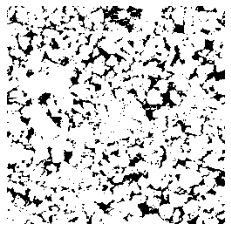

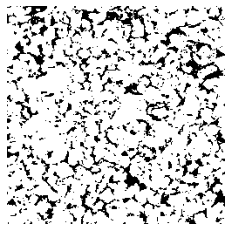

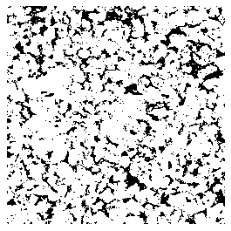

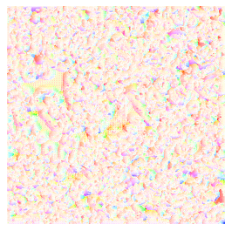

In [ ]:
#gt_data = list(val_datasets['Berea_2d25um_binary'].as_numpy_iterator())
import flow_vis

for x in train_dataset.take(1):
  frame1 = x[:,0,...]
  frame2 = x[:,1,...]
  of_pred = of_net([frame1, frame2])*50

  reconstruction = sample(frame1, tf.tile(tf.expand_dims(im_grid, 0), [of_pred.shape[0], 1, 1, 1])+of_pred)

  plt.axis('off')
  plt.imshow(frame1[0,:,:,0])
  plt.show()

  plt.axis('off')
  plt.imshow(frame2[0,:,:,0])
  plt.show()

  plt.axis('off')
  plt.imshow(binary_slice(reconstruction)[0,:,:,0])
  plt.show()

  plt.axis('off')
  plt.imshow(flow_vis.flow_to_color(of_pred[0]/250, convert_to_bgr=False))
  plt.show()

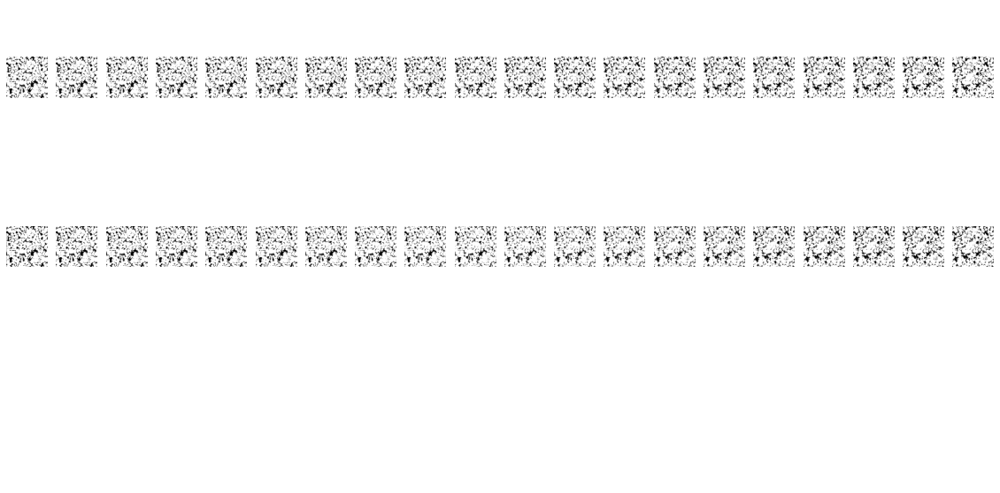

0.7173934 0.32103884


In [ ]:
#import flow_vis
#flow_color = flow_vis.flow_to_color(flow_uv, convert_to_bgr=False)

l_range = np.arange(from_n,to_n)

m = tf.keras.metrics.MeanIoU(num_classes=2)
m_mse = tf.keras.metrics.MeanSquaredError()

#gt_data = list(val_datasets['Berea_2d25um_binary'].as_numpy_iterator())
gt_data = list(val_datasets['BB_2d25um_binary'].as_numpy_iterator())

break_p = 20

frame1 = tf.expand_dims(gt_data[from_n-1],0)
frame2 = tf.expand_dims(gt_data[to_n],0)
of_pred = of_net([frame1, frame2])*50

def f(l):
  l = l - from_n + 1
  #print(l)
  of_pred_intr = (of_pred / 21)*l
  return sample(frame1, tf.tile(tf.expand_dims(im_grid, 0), [of_pred_intr.shape[0], 1, 1, 1])+of_pred_intr)

k = 1
fig = plt.figure(figsize=(20,10))
f_slice = None
dif_slice = None
dif_slice_warp = None
for l in l_range:
  intrp_slice = f(l)
  intrp_slice = binary_slice(intrp_slice)
  gt_sl = gt_data[l]

  if k == 1:
    f_slice = gt_sl

  plt.axis('off')
  fig.add_subplot(3,break_p,k)
  plt.imshow(gt_sl[:,:,0])

  plt.axis('off')
  fig.add_subplot(3,break_p,break_p+k)
  plt.imshow(intrp_slice[0,:,:,0])

  plt.axis('off')
  #print(k)
  m.update_state(gt_sl, intrp_slice)
  m_mse.update_state(gt_sl, intrp_slice)

  if k==9:
    dif_slice = gt_sl
    dif_slice_warp = intrp_slice

  k += 1

  #170:230,120:180
  
  #m.update_state(gt_sl, f_slice)

  if k == break_p + 1:
    break

  #pred_sl = tf.cast(tf.math.greater_equal(pred_sl, 0.6), tf.float32)
    
plt.show()

print(m.result().numpy(),m_mse.result().numpy())

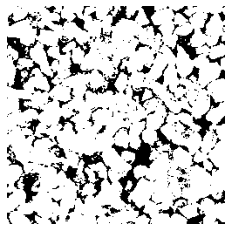

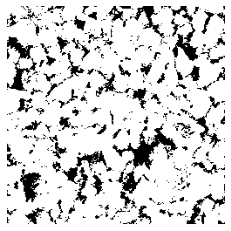

0.6375153 0.14856
tf.Tensor(0.203152, shape=(), dtype=float32) tf.Tensor(0.18224001, shape=(), dtype=float32) tf.Tensor(0.20558399, shape=(), dtype=float32)


In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=2)
m_mse = tf.keras.metrics.MeanSquaredError()

plt.axis('off')
plt.imshow(dif_slice[:,:,0])
plt.show()

plt.axis('off')
plt.imshow(dif_slice_warp[0,:,:,0])
plt.show()

m.update_state(dif_slice, dif_slice_warp[0])
m_mse.update_state(dif_slice, dif_slice_warp[0])
print(m.result().numpy(), m_mse.result().numpy())
print(1 - tf.reduce_mean(dif_slice), 1 - tf.reduce_mean(dif_slice_warp[0]), 1 - tf.reduce_mean(f_slice))

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=2)
m_mse = tf.keras.metrics.MeanSquaredError()
m.update_state(dif_slice, f_slice)
m_mse.update_state(dif_slice, f_slice)
print(m.result().numpy(), m_mse.result().numpy())

0.63690996 0.154656


In [ ]:
def flow2img(flow_data):
	"""
	convert optical flow into color image
	:param flow_data:
	:return: color image
	"""
	# print(flow_data.shape)
	# print(type(flow_data))
	u = flow_data[:, :, 0]
	v = flow_data[:, :, 1]

	UNKNOW_FLOW_THRESHOLD = 1e7
	pr1 = abs(u) > UNKNOW_FLOW_THRESHOLD
	pr2 = abs(v) > UNKNOW_FLOW_THRESHOLD
	idx_unknown = (pr1 | pr2)
	u[idx_unknown] = v[idx_unknown] = 0

	# get max value in each direction
	maxu = -999.
	maxv = -999.
	minu = 999.
	minv = 999.
	maxu = max(maxu, np.max(u))
	maxv = max(maxv, np.max(v))
	minu = min(minu, np.min(u))
	minv = min(minv, np.min(v))

	rad = np.sqrt(u ** 2 + v ** 2)
	maxrad = max(-1, np.max(rad))
	u = u / maxrad + np.finfo(float).eps
	v = v / maxrad + np.finfo(float).eps

	img = compute_color(u, v)

	idx = np.repeat(idx_unknown[:, :, np.newaxis], 3, axis=2)
	img[idx] = 0

	return np.uint8(img)


def compute_color(u, v):
	"""
	compute optical flow color map
	:param u: horizontal optical flow
	:param v: vertical optical flow
	:return:
	"""

	height, width = u.shape
	img = np.zeros((height, width, 3))

	NAN_idx = np.isnan(u) | np.isnan(v)
	u[NAN_idx] = v[NAN_idx] = 0

	colorwheel = make_color_wheel()
	ncols = np.size(colorwheel, 0)

	rad = np.sqrt(u ** 2 + v ** 2)

	a = np.arctan2(-v, -u) / np.pi

	fk = (a + 1) / 2 * (ncols - 1) + 1

	k0 = np.floor(fk).astype(int)

	k1 = k0 + 1
	k1[k1 == ncols + 1] = 1
	f = fk - k0

	for i in range(0, np.size(colorwheel, 1)):
		tmp = colorwheel[:, i]
		col0 = tmp[k0 - 1] / 255
		col1 = tmp[k1 - 1] / 255
		col = (1 - f) * col0 + f * col1

		idx = rad <= 1
		col[idx] = 1 - rad[idx] * (1 - col[idx])
		notidx = np.logical_not(idx)

		col[notidx] *= 0.75
		img[:, :, i] = np.uint8(np.floor(255 * col * (1 - NAN_idx)))

	return img


def make_color_wheel():
	"""
	Generate color wheel according Middlebury color code
	:return: Color wheel
	"""
	RY = 15
	YG = 6
	GC = 4
	CB = 11
	BM = 13
	MR = 6

	ncols = RY + YG + GC + CB + BM + MR

	colorwheel = np.zeros([ncols, 3])

	col = 0

	# RY
	colorwheel[0:RY, 0] = 255
	colorwheel[0:RY, 1] = np.transpose(np.floor(255 * np.arange(0, RY) / RY))
	col += RY

	# YG
	colorwheel[col:col + YG, 0] = 255 - np.transpose(np.floor(255 * np.arange(0, YG) / YG))
	colorwheel[col:col + YG, 1] = 255
	col += YG

	# GC
	colorwheel[col:col + GC, 1] = 255
	colorwheel[col:col + GC, 2] = np.transpose(np.floor(255 * np.arange(0, GC) / GC))
	col += GC

	# CB
	colorwheel[col:col + CB, 1] = 255 - np.transpose(np.floor(255 * np.arange(0, CB) / CB))
	colorwheel[col:col + CB, 2] = 255
	col += CB

	# BM
	colorwheel[col:col + BM, 2] = 255
	colorwheel[col:col + BM, 0] = np.transpose(np.floor(255 * np.arange(0, BM) / BM))
	col += + BM

	# MR
	colorwheel[col:col + MR, 2] = 255 - np.transpose(np.floor(255 * np.arange(0, MR) / MR))
	colorwheel[col:col + MR, 0] = 255

	return colorwheel

In [ ]:
list(tf.data.Dataset.range(100).window(seq_len, shift=window_shift, stride=window_stride, drop_remainder=True) \
            .flat_map(lambda window: window.batch(seq_len)).as_numpy_iterator())

[array([ 0, 19]),
 array([ 1, 20]),
 array([ 2, 21]),
 array([ 3, 22]),
 array([ 4, 23]),
 array([ 5, 24]),
 array([ 6, 25]),
 array([ 7, 26]),
 array([ 8, 27]),
 array([ 9, 28]),
 array([10, 29]),
 array([11, 30]),
 array([12, 31]),
 array([13, 32]),
 array([14, 33]),
 array([15, 34]),
 array([16, 35]),
 array([17, 36]),
 array([18, 37]),
 array([19, 38]),
 array([20, 39]),
 array([21, 40]),
 array([22, 41]),
 array([23, 42]),
 array([24, 43]),
 array([25, 44]),
 array([26, 45]),
 array([27, 46]),
 array([28, 47]),
 array([29, 48]),
 array([30, 49]),
 array([31, 50]),
 array([32, 51]),
 array([33, 52]),
 array([34, 53]),
 array([35, 54]),
 array([36, 55]),
 array([37, 56]),
 array([38, 57]),
 array([39, 58]),
 array([40, 59]),
 array([41, 60]),
 array([42, 61]),
 array([43, 62]),
 array([44, 63]),
 array([45, 64]),
 array([46, 65]),
 array([47, 66]),
 array([48, 67]),
 array([49, 68]),
 array([50, 69]),
 array([51, 70]),
 array([52, 71]),
 array([53, 72]),
 array([54, 73]),
 array([55

In [ ]:
list(tf.data.Dataset.range(100).window(window_stride + 1, shift=1, stride=1, drop_remainder=True) \
            .flat_map(lambda window: window.batch(window_stride + 1)).as_numpy_iterator())

[array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20]),
 array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21]),
 array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
        20, 21, 22]),
 array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
        21, 22, 23]),
 array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
        22, 23, 24]),
 array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
        23, 24, 25]),
 array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
        24, 25, 26]),
 array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
        25, 26, 27]),
 array([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
        26, 27, 28]),
 array([10, 11, 12, 

0it [00:00, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 250, 250, 1)


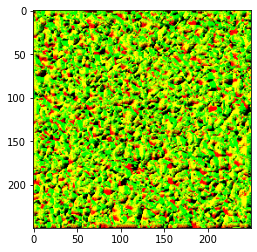

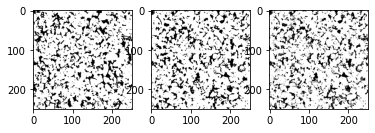

(20, 250, 250, 1)


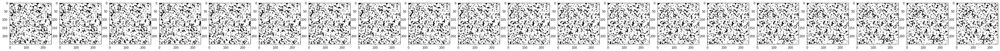

(20, 250, 250, 1)


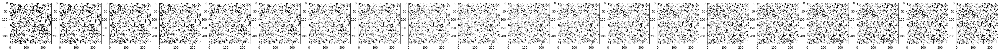

patch
(20, 250, 250, 1)


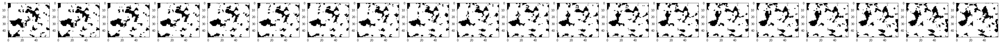

(20, 250, 250, 1)


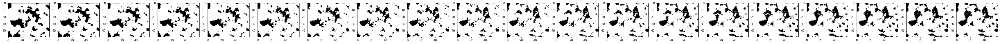

0it [00:08, ?it/s]


In [ ]:
for k, d in val_datasets.items():
  if k == 'Berea_2d25um_binary':
    d_full = d.window(window_stride + 1, shift=1, stride=1, drop_remainder=True) \
            .flat_map(lambda window: window.batch(window_stride + 1))
    d = d.window(seq_len, shift=window_shift, stride=window_stride, drop_remainder=True) \
            .flat_map(lambda window: window.batch(seq_len))
    #skip(20) - bad, skip(40) - good
    for sl, gt in tqdm(tf.data.Dataset.zip((d, d_full)).skip(40)):
      print(sl.shape)
      pred_of = of_net([tf.expand_dims(sl[0],0), tf.expand_dims(sl[1],0)])*50
      plt.imshow(tf.concat([(pred_of+1)/2, tf.zeros_like(pred_of)], -1)[0,:,:,:3])
      plt.show()

      reconstruction = sample(tf.expand_dims(sl[0],0), tf.tile(tf.expand_dims(im_grid, 0), [pred_of.shape[0], 1, 1, 1])+pred_of)

      fig = plt.figure()
    
      fig.add_subplot(1,3,1)
      plt.imshow(sl[0,:,:,0])
      fig.add_subplot(1,3,2)
      plt.imshow(sl[1,:,:,0])
      fig.add_subplot(1,3,3)
      plt.imshow(reconstruction[0,:,:,0])
      plt.show()

      fig = plt.figure(figsize=(60,60))
      print(gt.shape)
      for i in range(gt.shape[0]):
        fig.add_subplot(1,gt.shape[0],i+1)
        plt.imshow(gt[i,:,:,0])
      plt.show()

      fig = plt.figure(figsize=(60,60))
      print(gt.shape)
      for i in range(gt.shape[0]):
        pred_sl = sample(tf.expand_dims(gt[0],0), tf.tile(tf.expand_dims(im_grid, 0), [pred_of.shape[0], 1, 1, 1])+pred_of/(gt.shape[0]-1)*(i))
        pred_sl = tf.cast(tf.math.greater_equal(pred_sl, 0.6), tf.float32)
        fig.add_subplot(1,gt.shape[0],i+1)
        plt.imshow(pred_sl[0,:,:,0])
      plt.show()

      print('patch')

      fig = plt.figure(figsize=(60,60))
      print(gt.shape)
      for i in range(gt.shape[0]):
        fig.add_subplot(1,gt.shape[0],i+1)
        plt.imshow(gt[i,0:50,170:230,0])
      plt.show()

      fig = plt.figure(figsize=(60,60))
      print(gt.shape)
      for i in range(gt.shape[0]):
        pred_sl = sample(tf.expand_dims(gt[0],0), tf.tile(tf.expand_dims(im_grid, 0), [pred_of.shape[0], 1, 1, 1])+pred_of/(gt.shape[0]-1)*(i))
        pred_sl = tf.cast(tf.math.greater_equal(pred_sl, 0.6), tf.float32)
        fig.add_subplot(1,gt.shape[0],i+1)
        plt.imshow(pred_sl[0,0:50,170:230,0])
      plt.show()
      #print(pred_of)
      break

In [ ]:
print(latent_enc)

tf.Tensor(
[[[-0.12454032 -0.370977   -0.14689367 ...  1.2344581   3.4595988
    0.6537889 ]]

 [[-0.08231509 -0.33848837 -0.07736009 ...  1.1539122   3.4255393
    0.6204153 ]]

 [[-0.1085722  -0.3763242  -0.09664901 ...  1.2591531   3.4971478
    0.6374598 ]]

 ...

 [[ 0.01528361  1.671671    0.1454618  ... -1.045827   -0.34760237
   -0.7079242 ]]

 [[-0.06371707  1.5717099   0.14095215 ... -1.0565977  -0.33343422
   -0.6898511 ]]

 [[ 0.04972481  1.3924526   0.2678912  ... -1.0293438  -0.07740106
   -0.5896957 ]]], shape=(1000, 1, 8), dtype=float32)


In [ ]:
print(latent_enc.shape)

(1000, 1, 8)


In [ ]:
latent_enc = tf.squeeze(latent_enc)
print(latent_enc.shape)

(1000, 8)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pca = PCA(n_components=2)
pca.fit(latent_enc)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [ ]:
pca.explained_variance_ratio_

array([0.54732523, 0.16908142])

In [ ]:
Z_pca = pca.transform(latent_enc)
Z_pca.shape

(1000, 2)

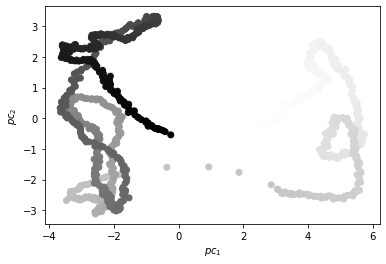

In [ ]:
fig, ax = plt.subplots()

ax.scatter(*Z_pca.T, c=np.arange(0.,1.,1/1000), cmap=plt.get_cmap('Greys'))

ax.set_xlabel('$pc_1$')
ax.set_ylabel('$pc_2$')

plt.show()

In [ ]:
tsne = TSNE(n_components=2, n_iter=5000)
#tsne.fit(latent_enc)
Z_tsne = tsne.fit_transform(latent_enc)

In [ ]:
np.arange(0.,1.,1/1000).shape

(1000,)

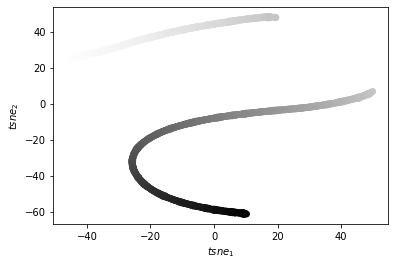

In [ ]:
fig, ax = plt.subplots()

ax.scatter(*Z_tsne.T, c=np.arange(0.,1.,1/1000), cmap=plt.get_cmap('Greys'))

ax.set_xlabel('$tsne_1$')
ax.set_ylabel('$tsne_2$')

plt.show()

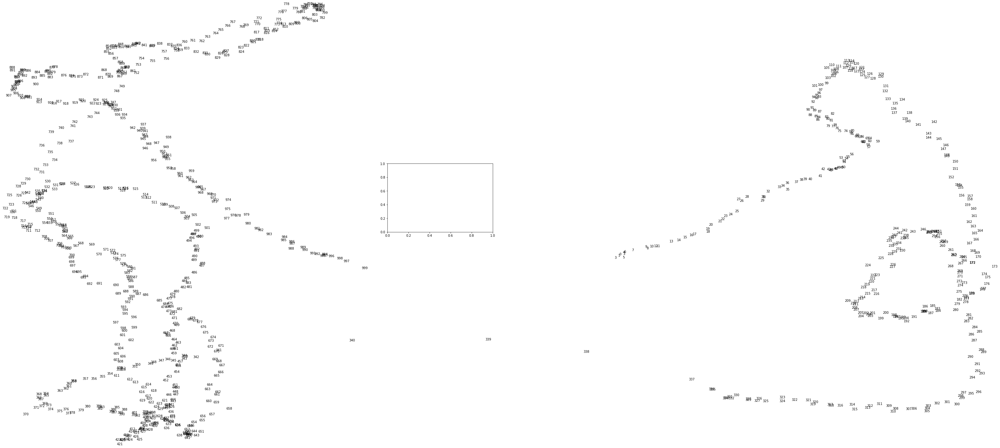

In [ ]:
for i in range(1000):
  plt.text(Z_pca[i,0],  Z_pca[i,1], str(i))
plt.show()

<Figure size 432x288 with 0 Axes>

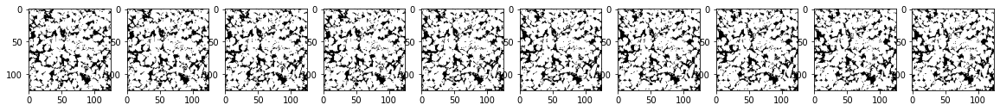

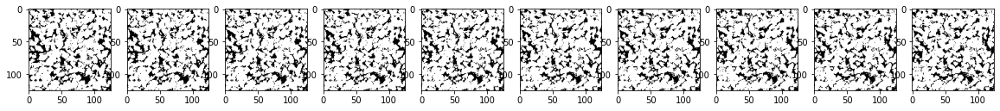

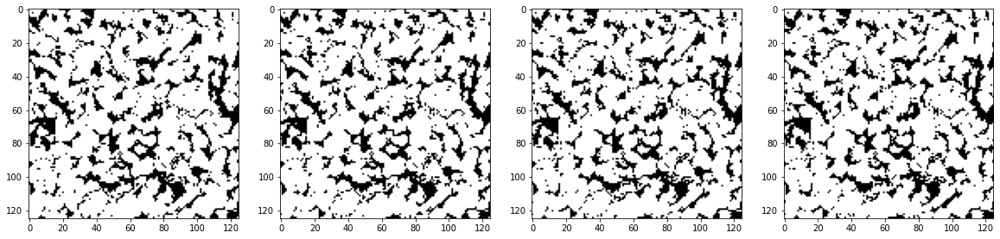

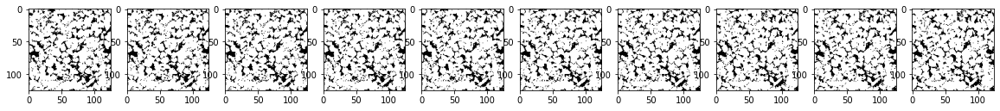

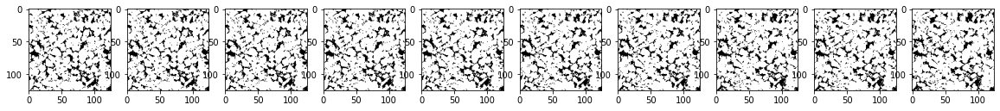

In [ ]:
plt.gray()

td_np = list(val_datasets['BB_2d25um_binary'].as_numpy_iterator())

fig = plt.figure(figsize=(20,20))
for i in range(10):
  fig.add_subplot(1,10,i+1)
  plt.imshow(td_np[317+i][:,:,0])
plt.show()
fig = plt.figure(figsize=(20,20))
for i in range(10):
  fig.add_subplot(1,10,i+1)
  plt.imshow(td_np[327+i][:,:,0])
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(4):
  fig.add_subplot(1,4,i+1)
  plt.imshow(td_np[337+i][:,:,0])
plt.show()

fig = plt.figure(figsize=(20,20))
for i in range(10):
  fig.add_subplot(1,10,i+1)
  plt.imshow(td_np[347+i][:,:,0])
plt.show()
fig = plt.figure(figsize=(20,20))
for i in range(10):
  fig.add_subplot(1,10,i+1)
  plt.imshow(td_np[357+i][:,:,0])
plt.show()

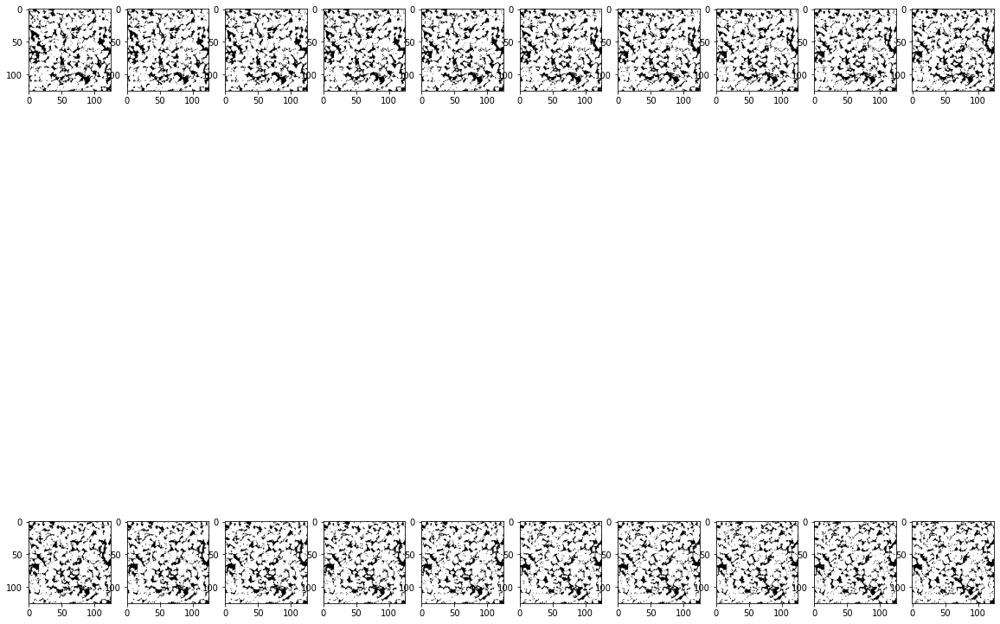

In [ ]:
fig = plt.figure(figsize=(20,20))
for i in range(20):
  fig.add_subplot(2,10,i+1)
  plt.imshow(td_np[330+i][:,:,0])
plt.show()

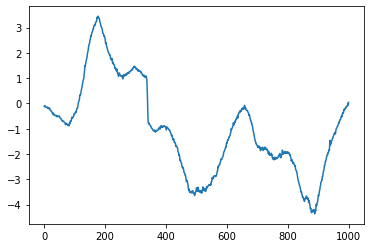

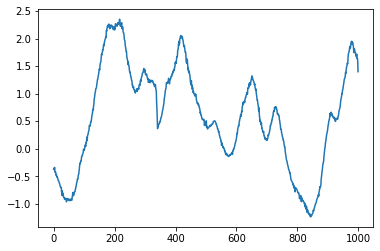

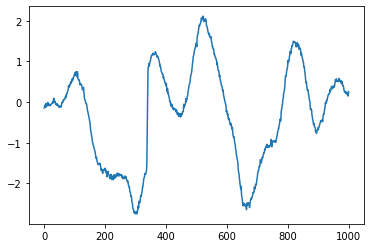

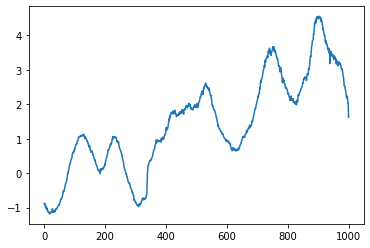

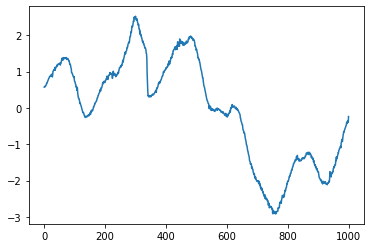

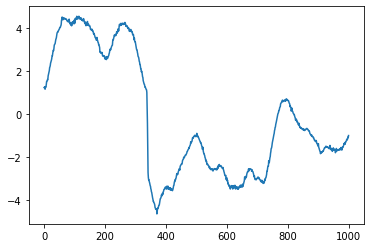

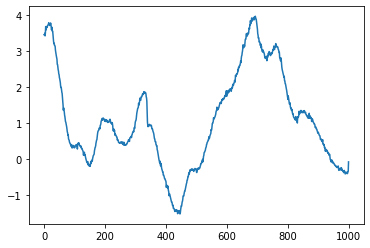

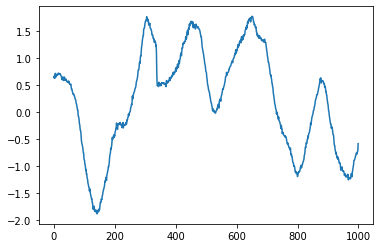

In [ ]:
for i in range(latent_enc.shape[1]):
  plt.plot(latent_enc[:,i])
  plt.show()
  #print(latent_enc[:,i])


BB_2d25um_binary
BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

BB_2d25um_binary


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

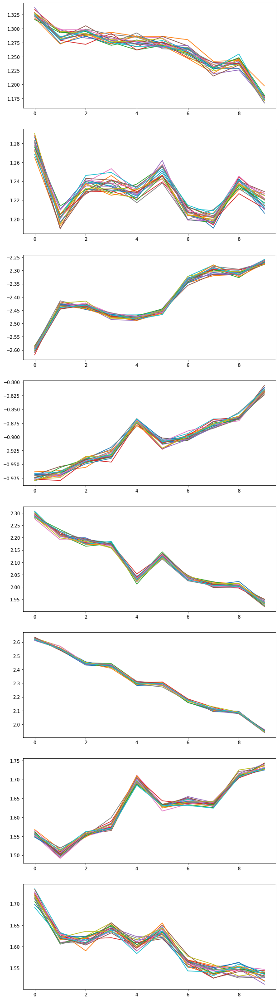

In [ ]:
fig = plt.figure(figsize=(10,40))
for smpl_n in range(20):
  for k, d in val_datasets.items():
    latent_enc_smpl = []
    print(k)
    for sl in d:
      z_mean, z_log_var, z = encoder(tf.expand_dims(sl,0))
      latent_enc_smpl.append(z)
    latent_enc_smpl = tf.stack(latent_enc_smpl)
    latent_enc_smpl = tf.squeeze(latent_enc_smpl)[310:320,:]
    for i in range(latent_enc_smpl.shape[1]):
      fig.add_subplot(latent_enc_smpl.shape[1],1,i+1)
      plt.plot(latent_enc_smpl[:,i])
plt.show()

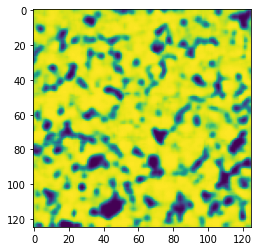

In [ ]:
 plt.imshow(decoder(latent_enc[20:21,:])[0,:,:,0])
plt.show()

In [ ]:
refinement_inputs = keras.Input(shape=input_shape)
x = layers.Conv2D(32, 3, activation="relu", padding="same")(refinement_inputs)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(1, 3, activation="sigmoid", padding="same")(x)
refinement_net = keras.Model(refinement_inputs, x, name="refinement_net")
refinement_net.summary()

Model: "refinement_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 125, 125, 1)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 125, 125, 32)      320       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 125, 125, 64)      36928     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 125, 125, 64)      36928     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 125, 125, 1)       577       
Total params: 93,249
Trainable params: 93,249
Non-trainable params: 0
________________________________________________

In [ ]:
@tf.function
def loss_func_refine(x):
  #return tf.reduce_mean(tf.square(t-p))
  _, _, z = encoder(x)
  reconstruction = decoder(z)
  refined = refinement_net(reconstruction)
  # reconstruction_loss = tf.reduce_mean(
  #     tf.reduce_sum(
  #         keras.losses.binary_crossentropy(x, refined), axis=(1, 2)
  #     )
  # )
  reconstruction_loss = tf.reduce_mean(tf.square(x-refined))
  total_loss = reconstruction_loss
  return total_loss, refined

refine_mean_loss_train = tf.keras.metrics.Mean()
refine_mean_loss_test = tf.keras.metrics.Mean()

refine_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

@tf.function
def refine_training_step(x):
    with tf.GradientTape() as tape:
        loss, _ = loss_func_refine(x)
    grads = tape.gradient(loss, refinement_net.trainable_variables)
    refine_optimizer.apply_gradients(zip(grads, refinement_net.trainable_variables))
    refine_mean_loss_train(loss)

2000it [00:16, 122.28it/s]


Epoch #0: Loss 0.13313372433185577, Test loss 0.13383547961711884


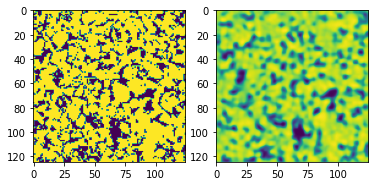

2000it [00:15, 125.15it/s]


Epoch #1: Loss 0.13024383783340454, Test loss 0.1335996687412262


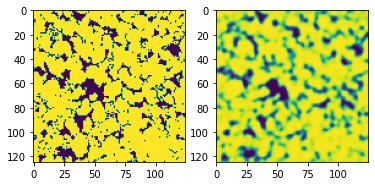

2000it [00:20, 97.52it/s] 


Epoch #2: Loss 0.13015031814575195, Test loss 0.133539617061615


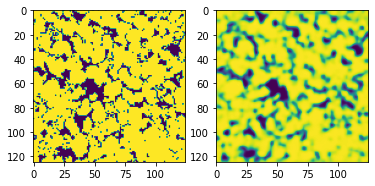

2000it [00:20, 97.51it/s] 


Epoch #3: Loss 0.13009688258171082, Test loss 0.13344085216522217


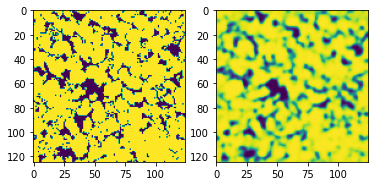

2000it [00:16, 123.85it/s]


Epoch #4: Loss 0.13006405532360077, Test loss 0.1334427446126938


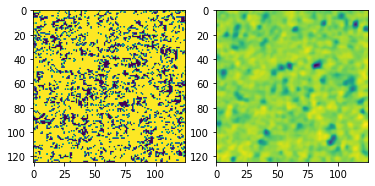

2000it [00:15, 127.16it/s]


Epoch #5: Loss 0.13004539906978607, Test loss 0.13342252373695374


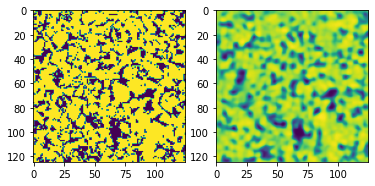

2000it [00:15, 125.45it/s]


Epoch #6: Loss 0.1300179660320282, Test loss 0.1334443986415863


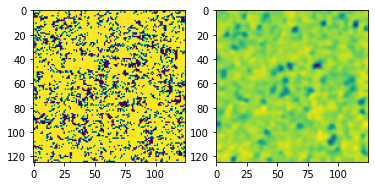

2000it [00:16, 122.96it/s]


Epoch #7: Loss 0.1300113946199417, Test loss 0.13340649008750916


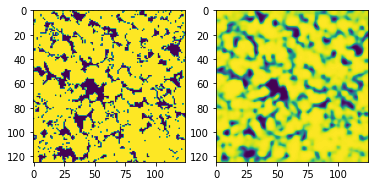

2000it [00:15, 126.04it/s]


Epoch #8: Loss 0.13000363111495972, Test loss 0.13339872658252716


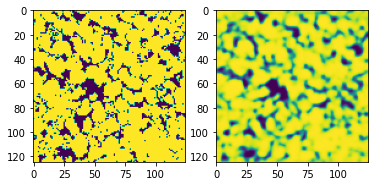

2000it [00:15, 125.41it/s]


Epoch #9: Loss 0.12998135387897491, Test loss 0.13337813317775726


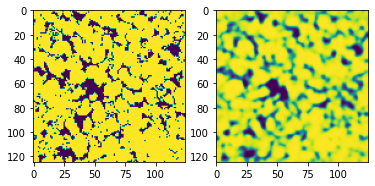

2000it [00:16, 121.22it/s]


Epoch #10: Loss 0.12997649610042572, Test loss 0.1334260255098343


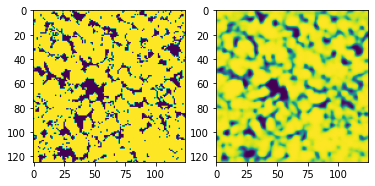

2000it [00:20, 97.49it/s] 


Epoch #11: Loss 0.12996697425842285, Test loss 0.13339298963546753


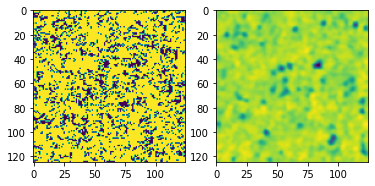

2000it [00:20, 97.50it/s] 


Epoch #12: Loss 0.1299625039100647, Test loss 0.13344630599021912


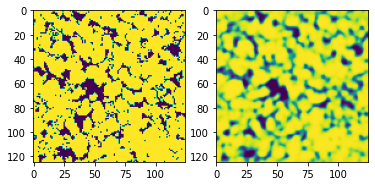

2000it [00:16, 122.80it/s]


Epoch #13: Loss 0.12994424998760223, Test loss 0.13338956236839294


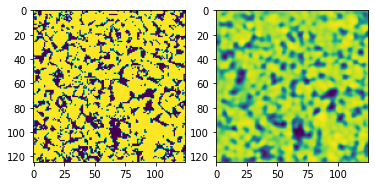

2000it [00:16, 120.60it/s]


Epoch #14: Loss 0.1299406737089157, Test loss 0.13337932527065277


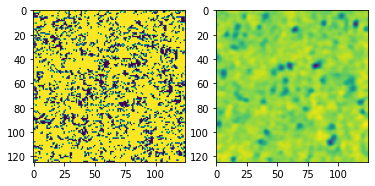

2000it [00:16, 119.09it/s]


Epoch #15: Loss 0.12993307411670685, Test loss 0.13336767256259918


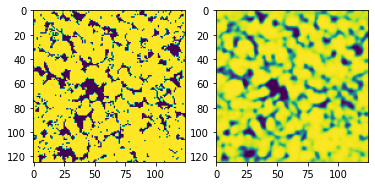

2000it [00:16, 122.51it/s]


Epoch #16: Loss 0.12992599606513977, Test loss 0.13330669701099396


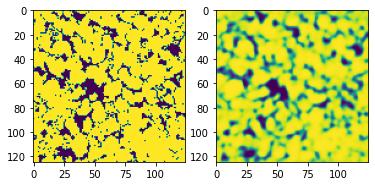

2000it [00:16, 120.27it/s]


Epoch #17: Loss 0.12993349134922028, Test loss 0.1333104968070984


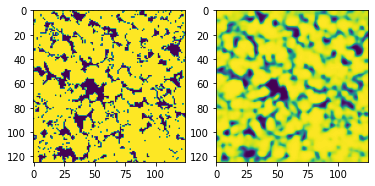

2000it [00:20, 97.51it/s] 


Epoch #18: Loss 0.12991756200790405, Test loss 0.13329552114009857


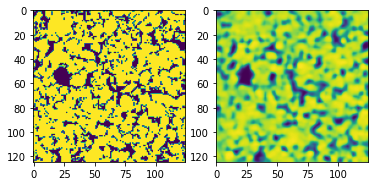

2000it [00:16, 121.98it/s]


Epoch #19: Loss 0.12991099059581757, Test loss 0.13336874544620514


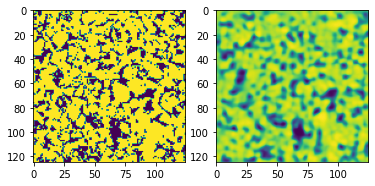

2000it [00:16, 121.32it/s]


Epoch #20: Loss 0.12989987432956696, Test loss 0.13335111737251282


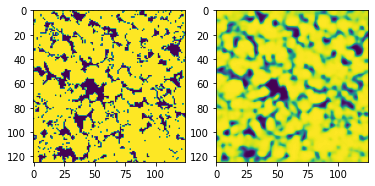

2000it [00:20, 97.50it/s] 


Epoch #21: Loss 0.129898801445961, Test loss 0.13335002958774567


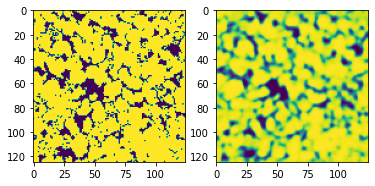

2000it [00:16, 122.13it/s]


Epoch #22: Loss 0.1298937350511551, Test loss 0.1332748681306839


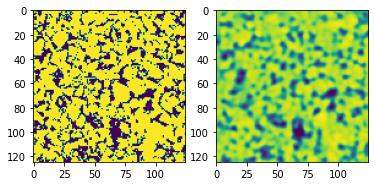

2000it [00:20, 97.47it/s] 


Epoch #23: Loss 0.12987414002418518, Test loss 0.13327665627002716


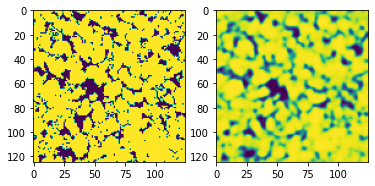

2000it [00:16, 118.40it/s]


Epoch #24: Loss 0.12987639009952545, Test loss 0.13335227966308594


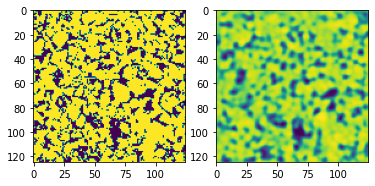

2000it [00:16, 121.21it/s]


Epoch #25: Loss 0.129876971244812, Test loss 0.13327470421791077


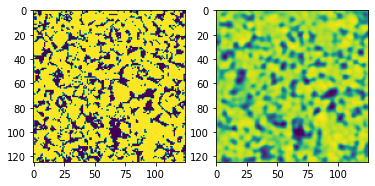

2000it [00:16, 119.67it/s]


Epoch #26: Loss 0.12986867129802704, Test loss 0.1333136260509491


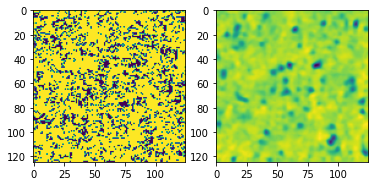

2000it [00:17, 117.44it/s]


Epoch #27: Loss 0.12986400723457336, Test loss 0.133401021361351


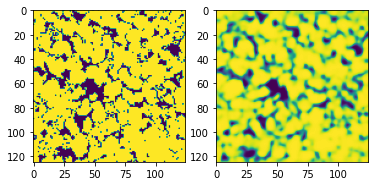

2000it [00:17, 117.38it/s]


Epoch #28: Loss 0.12985393404960632, Test loss 0.13331125676631927


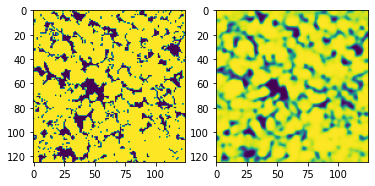

2000it [00:16, 118.73it/s]


Epoch #29: Loss 0.12985318899154663, Test loss 0.13331185281276703


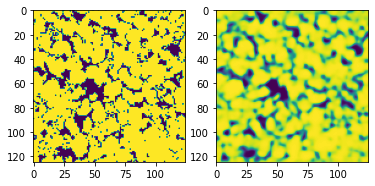

2000it [00:16, 119.77it/s]


Epoch #30: Loss 0.1298363208770752, Test loss 0.13326352834701538


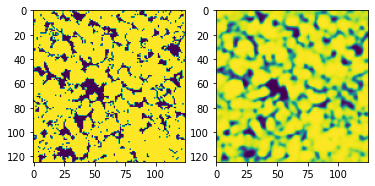

2000it [00:16, 119.06it/s]


Epoch #31: Loss 0.1298404484987259, Test loss 0.1332741230726242


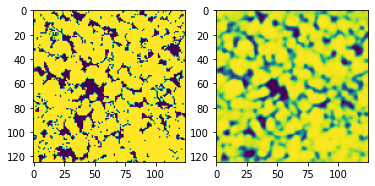

2000it [00:16, 118.51it/s]


Epoch #32: Loss 0.12983618676662445, Test loss 0.13328388333320618


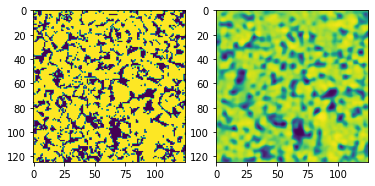

2000it [00:16, 121.64it/s]


Epoch #33: Loss 0.12982890009880066, Test loss 0.13327500224113464


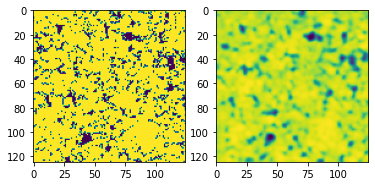

2000it [00:16, 120.22it/s]


Epoch #34: Loss 0.12982311844825745, Test loss 0.13323882222175598


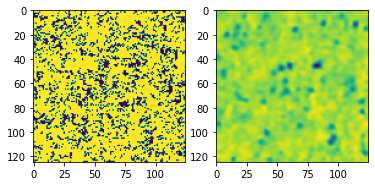

2000it [00:20, 97.50it/s] 


Epoch #35: Loss 0.12982015311717987, Test loss 0.13323336839675903


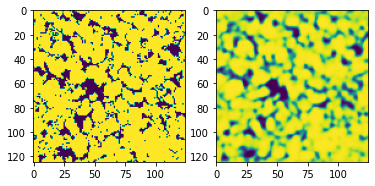

2000it [00:16, 121.22it/s]


Epoch #36: Loss 0.129814013838768, Test loss 0.1332392543554306


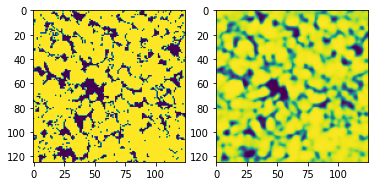

2000it [00:16, 120.26it/s]


Epoch #37: Loss 0.12980541586875916, Test loss 0.13325904309749603


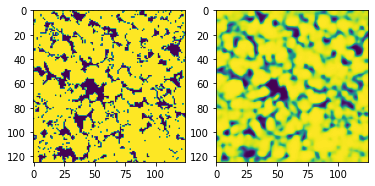

2000it [00:17, 115.59it/s]


Epoch #38: Loss 0.12979654967784882, Test loss 0.13323840498924255


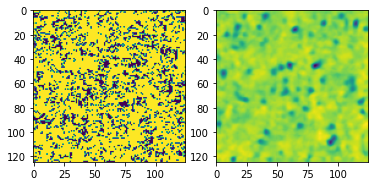

2000it [00:16, 120.32it/s]


Epoch #39: Loss 0.12978900969028473, Test loss 0.13321860134601593


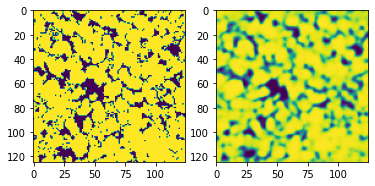

2000it [00:20, 97.50it/s] 


Epoch #40: Loss 0.12978923320770264, Test loss 0.13321688771247864


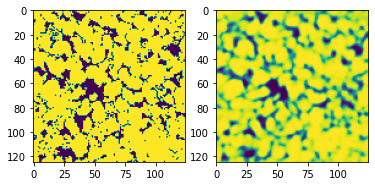

2000it [00:17, 116.07it/s]


Epoch #41: Loss 0.12978582084178925, Test loss 0.13329625129699707


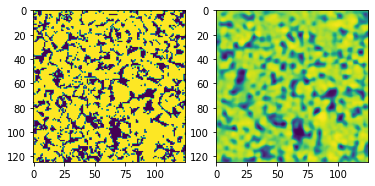

2000it [00:17, 116.86it/s]


Epoch #42: Loss 0.1297793686389923, Test loss 0.1332564502954483


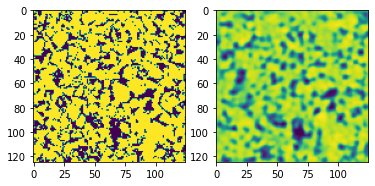

2000it [00:20, 97.46it/s] 


Epoch #43: Loss 0.1297677606344223, Test loss 0.1332126408815384


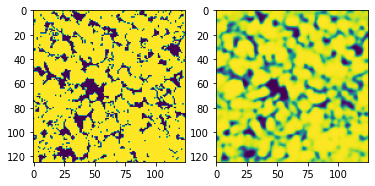

2000it [00:16, 119.45it/s]


Epoch #44: Loss 0.1297658383846283, Test loss 0.13339224457740784


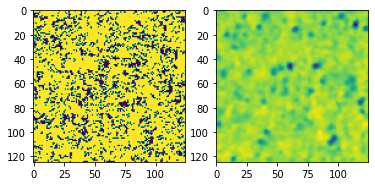

1742it [00:14, 114.91it/s]

KeyboardInterrupt: ignored

In [ ]:
for epoch in range(num_epochs):
    for x in tqdm(train_dataset):
        refine_training_step(x)
        
    train_x = x
        
    for x in test_dataset:
        loss, refined = loss_func_refine(x)
        refine_mean_loss_test(loss)
        
    print(f'Epoch #{epoch}: Loss {refine_mean_loss_train.result()}, Test loss {refine_mean_loss_test.result()}')
    
    fig = plt.figure()
    
    fig.add_subplot(1,2,1)
    plt.imshow(x[0,:,:,0])
    fig.add_subplot(1,2,2)
    plt.imshow(refined[0,:,:,0])
    plt.show()
    
    refine_mean_loss_train.reset_states()
    refine_mean_loss_test.reset_states()

    if epoch % 1 == 0:
      refinement_net.save_weights(f'./core_plugs/models_vae/refinement_net_mse_epoch_{epoch}.ckpt')

BB_2d25um_binary


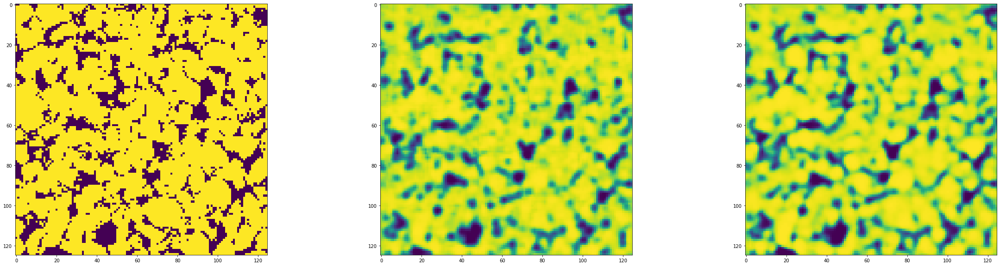

In [ ]:
# bce loss trained
for k, d in val_datasets.items():
  print(k)
  for sl in d.take(1):
    sl = tf.expand_dims(sl,0)
    z_mean, z_log_var, z = encoder(sl)
    decoded = decoder(z)
    refined = refinement_net(decoded)
    fig = plt.figure(figsize=(40,10))
    
    fig.add_subplot(1,3,1)
    plt.imshow(sl[0,:,:,0])
    fig.add_subplot(1,3,2)
    plt.imshow(decoded[0,:,:,0])
    fig.add_subplot(1,3,3)
    plt.imshow(refined[0,:,:,0])
    plt.show()

In [ ]:
# mse loss trained
for k, d in val_datasets.items():
  print(k)
  for sl in d.take(1):
    sl = tf.expand_dims(sl,0)
    z_mean, z_log_var, z = encoder(sl)
    decoded = decoder(z)
    refined = refinement_net(decoded)
    fig = plt.figure(figsize=(40,10))
    
    fig.add_subplot(1,3,1)
    plt.imshow(sl[0,:,:,0])
    fig.add_subplot(1,3,2)
    plt.imshow(decoded[0,:,:,0])
    fig.add_subplot(1,3,3)
    plt.imshow(refined[0,:,:,0])
    plt.show()

In [ ]:
core_porosity = []
for k, d in val_datasets.items():
  print(k)
  for sl in d:
    core_porosity.append(tf.reduce_mean(sl))
  core_porosity = tf.stack(core_porosity)

BB_2d25um_binary


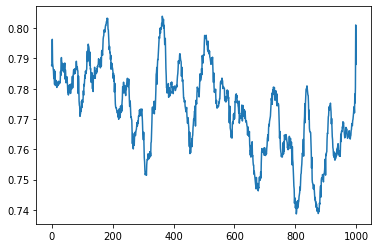

In [ ]:
plt.plot(core_porosity)
plt.show()

0.6772655844688416


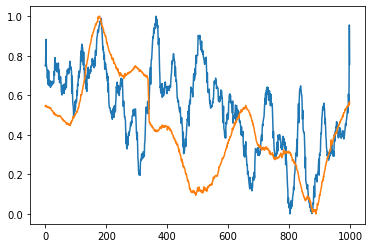

0.7262498438358307


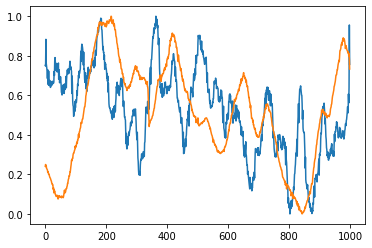

0.7485078275203705


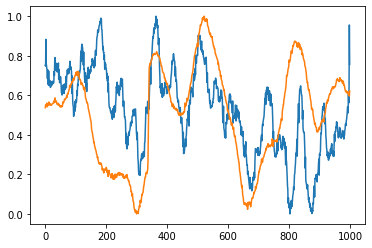

1.409371256828308


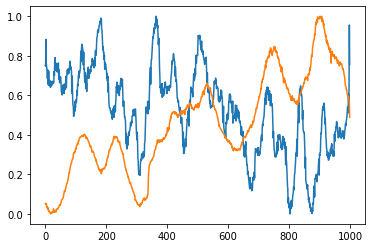

0.5203063786029816


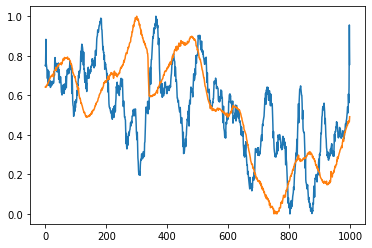

0.8126945346593857


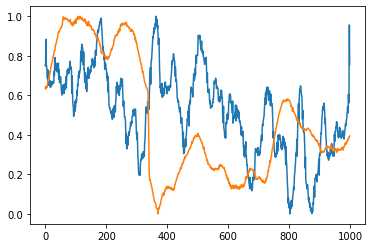

1.2914173305034637


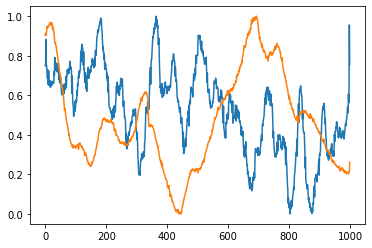

1.121036060154438


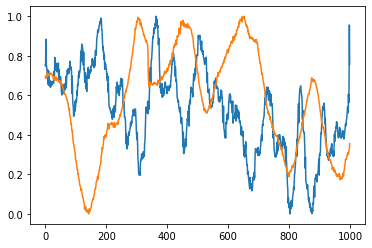

In [ ]:
import scipy

for i in range(latent_dim):
  scaled_latent_enc = latent_enc[:,i]
  scaled_latent_enc = (scaled_latent_enc - tf.reduce_min(scaled_latent_enc))/(tf.reduce_max(scaled_latent_enc)-tf.reduce_min(scaled_latent_enc))

  scaled_core_porosity = core_porosity
  scaled_core_porosity = (scaled_core_porosity - tf.reduce_min(scaled_core_porosity))/(tf.reduce_max(scaled_core_porosity)-tf.reduce_min(scaled_core_porosity))
  #print(tf.reduce_mean(tf.square(scaled_core_porosity -  scaled_latent_enc)))
  print(scipy.spatial.distance.correlation(scaled_core_porosity, scaled_latent_enc))
  plt.plot(scaled_core_porosity)
  plt.plot(scaled_latent_enc)
  plt.show()

AE results


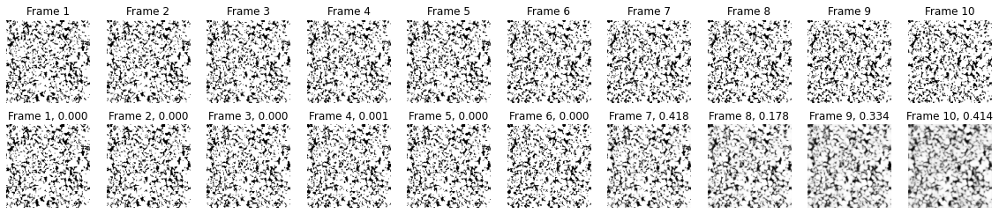

FP results


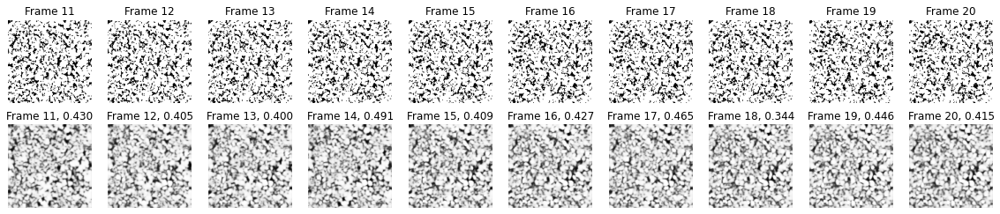

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(20, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(20)).batch(1)
  for w in d_windowed.skip(40).take(1):
    rx = w[:,:10,...]
    ry = w[:,10:,...]
    x_ae, y_fp = model(rx)
    print('AE results')
    # Construct a figure for the original and new frames.
    fig, axes = plt.subplots(2, 10, figsize=(20, 4))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(rx[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 1}")
        ax.axis("off")

    # Plot the new frames.
    x_ae = tf.reverse(x_ae,[1]).numpy()
    for idx, ax in enumerate(axes[1]):
        pred_f = np.squeeze(x_ae[0,idx,...])
        gt_f = np.squeeze(rx[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 1}, {ce_err}")
        ax.axis("off")
    plt.show()

    print('FP results')

    fig, axes = plt.subplots(2, 10, figsize=(20, 4))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(ry[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 11}")
        ax.axis("off")

    # Plot the new frames.
    y_fp = y_fp.numpy()
    for idx, ax in enumerate(axes[1]):
        pred_f = np.squeeze(y_fp[0,idx,...])
        gt_f = np.squeeze(ry[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 11}, {ce_err}")
        ax.axis("off")
    plt.show()

FP results


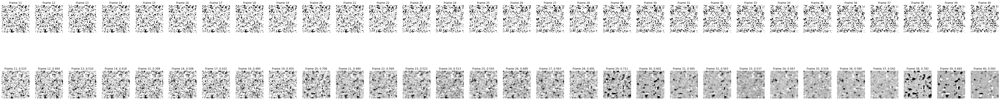

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(40, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(40)).batch(1)
  for w in d_windowed.skip(0).take(1):
    rx = w[:,:10,...]
    ry = w[:,10:,...]

    print('FP results')

    fig, axes = plt.subplots(2, 30, figsize=(80, 10))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(ry[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 11}")
        ax.axis("off")

    # Plot the new frames.
    for idx, ax in enumerate(axes[1]):
        x_ae, y_fp = model(rx)
        pred_f = np.squeeze(y_fp.numpy()[0,0,...])
        gt_f = np.squeeze(ry[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 11}, {ce_err}")
        ax.axis("off")
        rx = tf.concat([rx[:,1:,...], y_fp[:,0:1,...]], 1)
    plt.show()

FP results


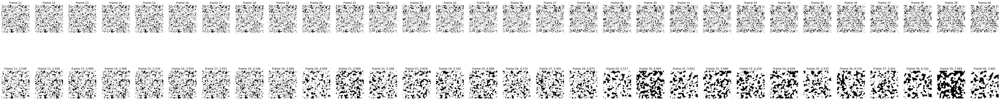

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(40, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(40)).batch(1)
  for w in d_windowed.skip(0).take(1):
    rx = w[:,:10,...]
    ry = w[:,10:,...]

    print('FP results')

    fig, axes = plt.subplots(2, 30, figsize=(80, 10))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(ry[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 11}")
        ax.axis("off")

    # Plot the new frames.
    for idx, ax in enumerate(axes[1]):
        x_ae, y_fp = model(rx)
        pred_f = y_fp[:,0:1,...]
        pred_slice_min = tf.reduce_min(pred_f)
        pred_slice_max = tf.reduce_max(pred_f)
        pred_slice = (pred_f - pred_slice_min)/(pred_slice_max-pred_slice_min)
        pred_slice = tf.cast(tf.math.greater(pred_slice, 0.6), tf.float32)

        pred_f = np.squeeze(pred_slice.numpy()[0])
        gt_f = np.squeeze(ry[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 11}, {ce_err}")
        ax.axis("off")
        rx = tf.concat([rx[:,1:,...], pred_slice], 1)
    plt.show()

FP results


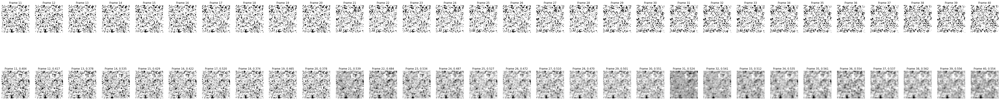

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(40, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(40)).batch(1)
  for w in d_windowed.skip(0).take(1):
    rx = w[:,:10,...]
    ry = w[:,10:,...]

    print('FP results')

    fig, axes = plt.subplots(2, 30, figsize=(80, 10))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(ry[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 11}")
        ax.axis("off")
    
    _, y_fp = model(rx)
    g_y_fp = y_fp

    for i in range(2):
      _, y_fp = model(y_fp)
      g_y_fp = tf.concat([g_y_fp, y_fp], 1)

    # Plot the new frames.
    for idx, ax in enumerate(axes[1]):
        pred_f = np.squeeze(g_y_fp.numpy()[0,idx,...])
        gt_f = np.squeeze(ry[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 11}, {ce_err}")
        ax.axis("off")
        rx = y_fp
    plt.show()

FP results


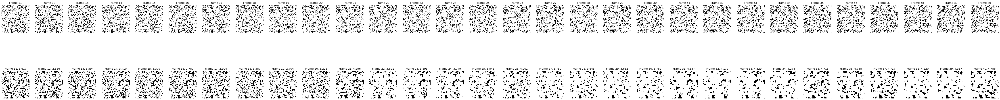

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(40, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(40)).batch(1)
  for w in d_windowed.skip(0).take(1):
    rx = w[:,:10,...]
    ry = w[:,10:,...]

    print('FP results')

    fig, axes = plt.subplots(2, 30, figsize=(80, 10))

    # Plot the original frames.
    for idx, ax in enumerate(axes[0]):
        ax.imshow(np.squeeze(ry[0,idx,...]), cmap="gray")
        ax.set_title(f"Frame {idx + 11}")
        ax.axis("off")

    _, y_fp = model(rx)
    g_y_fp = y_fp

    for i in range(2):
      _, y_fp = model(y_fp)
      g_y_fp = tf.concat([g_y_fp, y_fp], 1)

    # Plot the new frames.
    for idx, ax in enumerate(axes[1]):
        pred_f = g_y_fp[:,idx,...]
        pred_slice_min = tf.reduce_min(pred_f)
        pred_slice_max = tf.reduce_max(pred_f)
        pred_slice = (pred_f - pred_slice_min)/(pred_slice_max-pred_slice_min)
        pred_slice = tf.cast(tf.math.greater(pred_slice, 0.6), tf.float32)

        pred_f = np.squeeze(pred_slice.numpy()[0])
        gt_f = np.squeeze(ry[0,idx,...])
        ax.imshow(pred_f, cmap="gray")
        ce_err = "{:.3f}".format(loss_func(gt_f,pred_f))
        ax.set_title(f"Frame {idx + 11}, {ce_err}")
        ax.axis("off")
    plt.show()

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/core_plugs/models/epoch_0.ckpt')

In [ ]:
model.save_weights('/content/drive/MyDrive/core_plugs/models/epoch_7.ckpt')

In [ ]:
model.load_weights('/content/drive/MyDrive/core_plugs/models/epoch_7.ckpt')

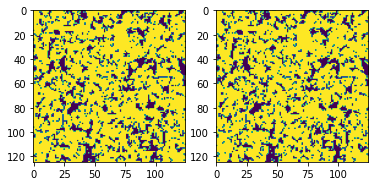

(1, 4, 125, 125, 1) (1, 1, 125, 125, 1)


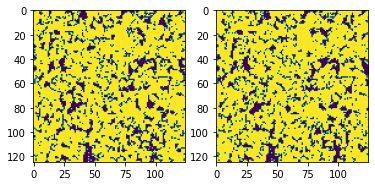

(1, 4, 125, 125, 1) (1, 1, 125, 125, 1)


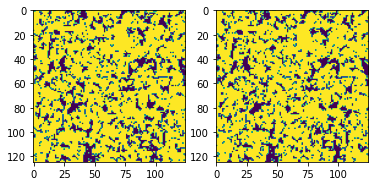

(1, 4, 125, 125, 1) (1, 1, 125, 125, 1)


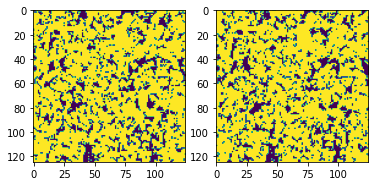

(1, 4, 125, 125, 1) (1, 1, 125, 125, 1)
[<tf.Tensor: shape=(), dtype=float32, numpy=0.033408>, <tf.Tensor: shape=(), dtype=float32, numpy=0.099328>, <tf.Tensor: shape=(), dtype=float32, numpy=0.067008>, <tf.Tensor: shape=(), dtype=float32, numpy=0.127616>]


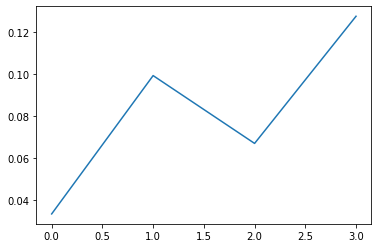

In [ ]:
for k, d in val_datasets.items():
  d_windowed = d \
    .window(10+100, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(10+100)).batch(1)
  for w in d_windowed.skip(1).take(1):
    pred_err = []
    inp_slice = w[:,:10,:,:,:]
    gt_slice = w[:,10:11,:,:,:]
    for i in range(1,100):
      pred_slices = model(inp_slice, training=False)
      fig = plt.figure()
      k = 1
      for j in range(10):
        pred_slice = tf.expand_dims(pred_slices[:,j,:,:,:], 1)
        fig.add_subplot(10,3,k)
        plt.imshow(w[0,,:,:,0])
        k += 1
      plt.show()
      pred_slice = tf.expand_dims(model(inp_slice, training=False)[:,-1,:,:,:], 1)
      pred_slice_min = tf.reduce_min(pred_slice)
      pred_slice_max = tf.reduce_max(pred_slice)
      pred_slice = (pred_slice - pred_slice_min)/(pred_slice_max-pred_slice_min)
      pred_slice = tf.cast(tf.math.greater(pred_slice, 0.5), tf.float32)
      pred_err.append(tf.reduce_mean(tf.square(gt_slice-pred_slice)))

      #print(pred_slice.shape, gt_slice.shape)

      fig = plt.figure()
      fig.add_subplot(1,2,1)
      plt.imshow(gt_slice[0,0,:,:,0])
      fig.add_subplot(1,2,2)
      plt.imshow(pred_slice[0,0,:,:,0])
      plt.show()

      inp_slice = tf.concat([inp_slice[:,1:,:,:,:], pred_slice], 1)
      gt_slice = w[:,4+i:4+i+1,:,:,:]

      print(inp_slice.shape, gt_slice.shape)
    print(pred_err)
    plt.plot(pred_err)
    plt.show()

In [ ]:
pred_errs = {}
for k, d in val_datasets.items():
  d_windowed = d \
    .window(9+100, shift=1, drop_remainder=True) \
    .flat_map(lambda window: window.batch(9+100)).batch(1)
  
  pred_errs[k] = []
    pred_err = [0]*100
    for w in d_windowed:
      inp_slice = w[:,:9,:,:,:]
      gt_slice = w[:,9:9,:,:,:]
      for i in range(1,100):
        pred_slice = tf.expand_dims(model(inp_slice)[:,-1,:,:,:], 1)
        pred_slice_min = tf.reduce_min(pred_slice)
        pred_slice_max = tf.reduce_max(pred_slice)
        pred_slice = (pred_slice - pred_slice_min)/(pred_slice_max-pred_slice_min)
        pred_slice = tf.cast(tf.math.greater(pred_slice, 0.5), tf.float32)
        pred_err[i-1] += tf.reduce_mean(tf.square(gt_slice-pred_slice))
        inp_slice = tf.concat([inp_slice[:,1:,:,:,:], pred_slice], 1)
        gt_slice = w[:,9+i:9+i,:,:,:]